<div style="width: 80%;">

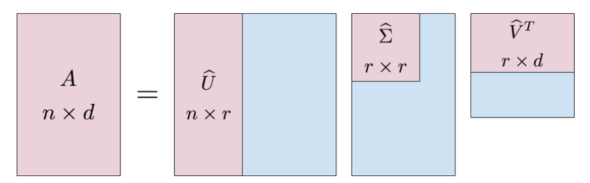
<div style="clear: both"></div>
<br>

<div style="font-size: 20pt; float: left;">Anwendungen der linearen Algebra</div>
<div style="font-size: 20pt; text-align: right;">FS 2023</div>
<div style="font-size: 15pt; margin-top: 10px;">Fachexperten: Roger Burkhardt, Cédric Huwyler</div>
</div>
<br>


# Mini-Challenge 3 zum Thema *Recommender-Systeme*

In der dritten Mini-Challenge befassen wir uns mit einem einfachen Recommender-System, mit dem du dir zu einem Film weitere ähnliche Filme vorschlagen lassen kannst. Recommender-Systemen, die uns aufgrund unserer bisherigen Konsumpräferenzen neue Produkte vorschlagen, die wir auch mögen könnten, begegnen wir in unserem digitalen Alltag typischerweise mehrmals täglich:

Aufgrund unserer bisherigen Historie (und, wie wir sehen werden, derjenigen von anderen Benutzer:innen des Systems) schlagen uns zum Beispiel Youtube oder TikTok neue Videos, Netflix neue Filme und Serien, Spotify oder Soundcloud neue Musik, Digitec, Amazon oder Zalando neue Produkte, Jobs.ch neue Jobs, Facebook oder LinkedIn neue Freunde, NZZ oder 20 Minuten neue Artikel, Google Play oder Apple Store neue Apps, Google Maps und Trip Advisor neue Restaurants, Partnerschaftsplattformen wie ElitePartner potentielle Partner vor, etc. 

Manche solche Systeme nutzen wir aktiv und bewusst, die Präsenz anderer bemerken wir vielleicht gar nicht. Recommender-Systeme haben typischerweise entweder für dich einen Nutzen (Vereinfachung des Entdeckungsprozesses), für die Firma (Cross- und Up-Selling / weiteren Konsum begünstigen) oder irgendetwas zwischendrin. Wem ein Recommender-System nützt, ist oft kritisch zu hinterfragen - in praktisch allen Fällen gewichtet die Firma ihre Interessen höher als deine. Nicht immer besteht der Erfolg der Firma daraus, dass du einen tatsächlichen Gewinn vom Recommender hast (wie z.B. bei einer Jobbörse oder Wohnungssuche). Zum Beispiel hat Youtube den Anreiz, dir jeweils viele kurze Videos ohne grossen Inhalt zu präsentieren, um dich länger auf der Plattform zu halten und mehr Werbung konsumieren zu lassen. Anstatt Videos vorgeschlagen zu bekommen, die dir im Leben tatsächlich einen Mehrwert bieten, wirst du etwas übertrieben gesagt von banalen Videos abhängige Konsument:in.

<div class="alert alert-block alert-danger">
<b>Übung</b><br>
Überlege dir, welche Recommender-Systeme du täglich nutzt. Welche davon sind klar als Recommender-Systeme erkennbar, welche vielleicht weniger? Hinterfrage auch kritisch, welche dieser Systeme eher dir und welche eher der Firma einen Mehrwert bieten. Welchen Mehrwert möchtest du aus dem Recommender-System ziehen und an welchem Mehrwert mag die Firma interessiert sein?
</div>


### Musterlösung

Zu dieser Minichallenge existiert (bewusst) keine Musterlösung. Du kannst sie aber gerne zur Durchsicht und Kommentierung uns entweder in einer der Kontaktstunden vorstellen oder zuschicken (cedric.huwyler@fhnw.ch).

### Libraries

Es reicht in dieser Übung aus, die folgenden Python-Libraries zu benutzen:

**Hinweis:** Allenfalls musst du das tqdm-Paket noch installieren.

In [92]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

## Hintergrund

<div class="alert alert-block alert-info">
Hier wird nur sehr oberflächlich auf die Funktionsweise von Recommendern eingangen und dabei mehr auf die damit verbundene lineare Algebra fokussiert. Wenn du mehr über Recommender wissen möchtest, so wird für dich am Studiengang Data Science die Kompetenz <i><a target="_blank" href="https://spaces.technik.fhnw.ch/spaces/recommender-systems">Recommender Systeme</a></i> dafür angeboten.
</div>

### Recommender-Systeme

Als Data Scientists möchten wir natürlich auch solche Recommender bauen und verstehen können. Zum Einen um sie im täglichen Gebrauch zu verstehen, zum anderen um selbst solche Recommender-System bauen zu können und schliesslich auch um die darin verwendeten Methoden im täglichen Berufsalltag einsetzen zu können. Ein Recommender-System muss nicht immer eine Online-Plattform sein, der Einsatz der hier besprochenen Techniken kann auch Sinn machen, wenn du die Kund:innen in einer bestehenden Datenbank charakterisieren möchtest und diese gezielt bei Verkaufsgesprächen (zum Beispiel empfehlen geeigneter Finanzinstrumente für Bankkund:innen) oder Marketingkampagnen (zum Beispiel über Cumulussystem von Migros) angehen möchtest.

Recommender-Systeme werden typischerweise in **content-basierte** und **kollaborationsbasierte** Systeme unterteilt. Content-basierte Systeme empfehlen ähnliche Produkte aufgrund von ähnlichen Produkteigenschaften (zum Beispiel zu einem Laptop ein passendes Ersatznetzteil), während kollaborationsbasierte Systeme in ihren Daten zu dir ähnliche Benutzer:innen suchen und dir die Dinge empfehlen, die diese mögen und die du noch nicht gekauft/konsumiert hast. Beide Ansätze haben ihre Berechtigung und oft werden in Realität Hybridansätze aus beiden Varianten eingesetzt. Der Einfachheit halber möchten wir uns aber hier nur auf kollaborationsbasierte Systeme (sogenanntes **Collaborative Filtering**) konzentrieren.

### Die Interaktionsmatrix

Die Basis von kollaborationsbasierten Systemen ist die sogenannte **Interaktions-** oder **User-Item-Matrix**. Sie enthält in den Zeilen die Benutzer:innen des Systems, in den Spalten die Produkte (Items) und als Matrixelemente jeweils die Bewertung, die Benutzer:in $i$ für Produkt $j$ abgegeben hat. Bewertungen werden entweder explizit (Sterne-Bewertung, Like, etc.) abgegeben, oder implizit (Konsumdauer, -häufigkeit, etc.). Hier eine beispielhafte Illustration:

<img src="mc3_interaktionsmatrix.png">

6 Benutzer:innen haben ingesamt 17 Bewertungen für 6 Bücher abgegeben. Niemand hat alle Bücher bewertet, nur etwa die Hälfte aller möglichen Bewertungen sind vorhanden. Die Interaktionsmatrix ist die Wissensbasis des Recommender-Systems, das wir bauen möchten - aus dieser Bewertungshistorie möchten wir nun die Ähnlichkeit zwischen zwischen verschiedenen Büchern bzw. im Allgemeinen Produkten herleiten.

Liegen Bewertungen von $m$ Nutzer:innen für $n$ Produkte vor, so ist die Interaktionsmatrix $X$ eine $(m\times n)$-Matrix.

Wir möchten nun im Folgenden gerne diese Interaktionsmatrix erstellen, damit wir von ihr ausgehend weiterrechnen können. Wir erstellen sie aus den beiden Dateien `movies.csv` und `ratings.csv`, die der Minichallenge beiliegen. Das dazu nötige Data Wrangling soll hier nicht im Fokus stehen, daher ist es bereits für dich erledigt:

Daten einlesen:

In [93]:
movies = pd.read_csv("movies.csv")
ratings = pd.read_csv("ratings.csv")

Bereinigungen durchführen:

In [94]:
movies['year'] = movies.title.str.extract("\((\d+)\)$").astype(float)
movies.title = movies.title.str.replace("\(\d+\)", "", regex=True)
movies.title = movies.title.str.replace(r'(.+), The', r'The \1', regex=True)
movies.title = movies.title.str.replace(r'(.+), A', r' \1', regex=True)
movies.title = movies.title.str.strip()
movies.head()

,movieId,title,genres,year
0,1,Toy Story,Adventure|Animation|Children|Comedy|Fantasy,1995.0
1,2,Jumanji,Adventure|Children|Fantasy,1995.0
2,3,Grumpier Old Men,Comedy|Romance,1995.0
3,4,Waiting to Exhale,Comedy|Drama|Romance,1995.0
4,5,Father of the Bride Part II,Comedy,1995.0


Filme ohne Rating entfernen:

In [95]:
movies = movies[movies.movieId.isin( ratings.movieId.unique() )].reset_index( drop=True )
movies.shape

(9724, 4)

Interaktionsmatrix erstellen:

In [96]:
I = pd.crosstab( ratings.userId, ratings.movieId, values=ratings.rating, aggfunc='mean', dropna=True ).fillna(0)
user_ids = I.index
movie_ids = I.columns
X = I.values
X.shape

(610, 9724)

Belegung der Interaktionsmatrix.

In [97]:
np.mean( X>0 )

0.016999683055613623

Nur 1.7% aller möglichen Bewertungen liegen vor!

In [98]:
X.shape, len(user_ids), len(movie_ids)

((610, 9724), 610, 9724)

### Vergleich von Filmen mit der Cosine-Similarity

Der kollaborationsbasierte Ansatz macht die folgende fundamentale Annahme:

<div class="alert alert-block alert-danger">
Wenn eine Person $A$ die gleiche Meinung über ein Produkt oder noch besser über eine Reihe von Produkten besitzt wie eine Person $B$, dann ist es wahrscheinlicher, dass sie auch zu einem weiteren Produkt die gleiche Meinung wie Person $B$ besitzt, als dass dies eine zufällig ausgewählte Person hätte. 
</div>


Haben also zwei Personen die gleichen Präferenzen für eine Reihe von Produkten und mag die erste Person das Produkt $X$, dann sollte man der zweiten dieses Produkt empfehlen, wenn sie es noch nicht gekauft/konsumiert hat. *Wir bezeichnen zwei Personen also als ähnlich, wenn sie die gleichen Produkte ähnlich bewertet haben*. Möchten wir einer Person $A$ Empfehlungen abgeben, so suchen wir nach der zu ihr ähnlichsten Person $B$ und empfehlen $A$ deren liebste Produkte. Dieser Ansatz wird **User-Based Collaborative Filtering (UBCF)** genannt. Für UBCF ist es eine Voraussetzung, dass bereits 20-30 Artikel bewertet wurden, ansonsten können selten sinnvolle Empfehlungen gemacht werden (das sogenannte *Cold Start Problem*).

Um grossen Rating-Aufwand von deiner Seite zu verhindern, befassen wir uns in dieser Mini-Challenge mit sogenanntem **Item-Based Collaborative Filtering (IBCF)**. Dieses fokussiert sich mehr auf die Ähnlichkeiten zwischen Produkten (bzw. 'Items'). Es nimmt an, dass zwei Produkte, bzw. in unserem Fall Filme, $A$ und $B$ sich umso ähnlicher sind, je mehr Personen die beiden Filme ähnlich oder gleich bewertet haben. Dies können wir konkret erreichen, indem wir die Vektorkomponenten bzw. die Vektoren mit den Ratings der beiden Filme vergleichen. Natürlich möchten wir nur dort Vergleiche machen, wo Benutzer:innen jeweils beide Filme bewertet haben.

Es gibt diverse Vergleichsmasse für Vektoren, das am häufigsten benutzte ist die sogenannte **Cosine-Similarity**:

In dieser ist für die Ähnlichkeit zweier Produktvektoren ausschliesslich deren Zwischenwinkel relevant, die Länge spielt keine Rolle. Dass diese Annahme für einen Recommender funktioniert, ist nicht offensichtlich, wir werden im Folgenden aber zeigen, dass die damit erzielten Resultate gar nicht so schlecht sind.

Der Zwischenwinkel zwischen zwei Vektoren $\mathbf{u}, \mathbf{v} \in \mathbb{R}^n$ kann mit folgender Formel berechnet werden (siehe *Grundlagen der linearen Algebra*):

$$\cos\alpha = \frac{\mathbf{u} \cdot \mathbf{v}}{|\mathbf{u}| \; |\mathbf{v}|}.$$

Er resultiert aus der Gleichsetzung der zwei Varianten, ein Skalarprodukt zu schreiben: über Multiplikation und Aufsummierung der Vektorkomponenten oder über die Multiplikation der Beträge der Vektoren mit dem Cosinus ihres Zwischenwinkels $\alpha$.
Ist $\mathbf{u}$ der Vektor mit allen Ratings zu Film $A$ und $\mathbf{v}$ der Vektor mit allen Ratings zu Film $B$, dann sind sich $A$ und $B$ umso ähnlicher, je kleiner der Zwischenwinkel

$$\alpha = \arccos\left(\frac{\mathbf{u} \cdot \mathbf{v}}{|\mathbf{u}| \; |\mathbf{v}|}\right)$$

zwischen $\mathbf{u}$ und $\mathbf{v}$ ist. Je näher bei Null, desto besser, je weiter davon entfernt, desto schlechter. 

<br>

Mit einigen kleinen Überlegungen können wir auf die Berechnung des Arkuscosinus verzichten. Folgender ist der Funktionsgraph von $\cos{\alpha}$:

<img src="mc3_cosinus.png" width="450">

Da die Matrixelemente der Interaktionsmatrix $X$ nur positive Elemente enthalten (1-5 Sterne), ist auch das Skalarprodukt zweier beliebiger Spaltenvektoren von $X$ immer positiv und damit auch der Cosinus des Zwischenwinkels, da auch die Beträge der Vektoren im Nenner immer positiv sind. Laut dem obigen Funktionsgraph können wir uns also nur zwischen Winkeln von -90$^\circ$ und 90$^\circ$ bewegen. Die Cosinusfunktion ist 1 für einen Zwischenwinkel von 0$^\circ$ (perfekt parallele Vektoren) und wird für betragsmässig grössere Zwischenwinkel nur noch kleiner und wird schliesslich 0, wenn die Vektoren senkrecht zueinander stehen (was jedoch keine besondere Bedeutung für den Recommender hat). Wir können also sagen, dass zwei Vektoren einander perfekt ähnlich sind, wenn $\cos\alpha = 1$ und dass sie sich umso weniger ähnlich sind, je kleiner $\cos\alpha$ ist. Damit können wir auf die Berechnung der Cosinus-Funktion verzichten und nur den Wert des Skalarprodukts geteilt durch das Produkt der Vektorbeträge betrachten.

<div class="alert alert-block alert-warning">
Damit definieren wir die <b>Cosine-Similarity</b> für $\mathbf{u}, \mathbf{v} \in \mathbb{R}^n$ als

$$
s(\mathbf{u}, \mathbf{v}) = \frac{\mathbf{u} \cdot \mathbf{v}}{|\mathbf{u}| \; |\mathbf{v}|}\quad\text{mit}\quad s(\mathbf{u}, \mathbf{v}) \in [0,1].
$$

</div>


Hier ist interessant, dass wir die Cosine-Similarity nur die Fälle betrachten lassen können, wo beide Nutzer:innen eine Bewertung abgegeben haben. Setzen wir nämlich die Felder der Interaktionsmatrix in denen eine Bewertung fehlt gleich null, so tragen diese Felder nichts zur Cosine-Similarity bei (da das Skalarprodukt als Summe $\mathbf{u} \cdot \mathbf{v} = \sum_i u_i v_i$ berechnet wird und keine Beiträge entstehen, wenn $u_i$ oder $v_i$ null ist).

Wir können diese Methode nun benutzen, um zu einem Film, den wir mögen, ähnliche Filme zu finden. Dazu benutzen wir das [Movie-Lens](https://movielens.org/)-Datenset, das seit 1997 Film-Bewertungen mit einer wachsenden Userbase sammelt. In diesem Fall benutzen wir das [kleinstmögliche Datenset](https://www.kaggle.com/shubhammehta21/movie-lens-small-latest-dataset) mit nur 610 Nutzer:innen und 9742 Filmen, um den Rechenaufwand beträchtlich zu minimieren.

## Deine Aufgabe

### a) Einzelne Cosine-Similarity berechnen

Gegeben sei also die Interaktionsmatrix $\mathbf{X} \in \mathbb{R}^{610 \times 9724}$. Die Cosine-Similarity zwischen Film $i$ und Film $j$ ist definiert als

$$s_{ij} = \frac{\mathbf{x}_i \cdot \mathbf{x}_j}{|\mathbf{x}_i| \; |\mathbf{x}_j|},$$

wobei $\mathbf{x}_i$ der i-te Spaltenvektor von $\mathbf{X}$ bezeichne. 

Berechne als Beispiel die Cosine-Similarity zwischen den Filmen 'Star Wars: Episode IV - A New Hope' ($i=224$) und 'Star Wars: Episode V - The Empire Strikes Back' ($j=897$). Benutze dazu die Befehle `np.dot()` und `np.linalg.norm()`. Definiere zuerst die Spaltenvektoren `xi` und `xj` mit geeignetem Slicing von $X$ und prüfe, ob diese jeweils 610 Elemente enthalten (eine Bewertung pro Benutzer:in). Sind die Filme einander gemäss diesem Mass ähnlich?

In [99]:
# Spaltenvektoren xi und xj definieren
xi = X[:, 224]
xj = X[:, 897]
# Überprüfen, ob die Vektoren 610 Elemente enthalten
display(xi.shape, xj.shape)

(610,)

(610,)

In [100]:
# Cosine-Similarity berechnen
xi.T.dot(xj) / (np.linalg.norm(xi) * np.linalg.norm(xj))

0.8324073552233734

### b) Ähnlichkeitsmatrix $S$ mit for-Schleife berechnen

Für unser Recommender-System möchten wir gerne auf Vorrat $s_{ij}$ für alle Benutzer:innen $i$ und Filme $j$ berechnen, damit wir nachher schnell für alle Produkte Empfehlungen berechnen können. Damit erhalten wir die sogenannte **Ähnlichkeitsmatrix** $\mathbf{S} \in \mathbb{R}^{9724 \times 9724}$, deren Elemente gerade die $s_{ij}$ sind.

Wir haben in a) ein einzelnes Element $s_{ij}$ der Matrix $S$ berechnet. Um die ganze Ähnlichkeitsmatrix zu berechnen, können wir mit einer verschachtelten for-Schleife über alle $i$ und $j$ iterieren und die einzelnen Elemente von $S$ befüllen. Es wird sich zeigen, dass dieser Ansatz sehr ineffizient ist und etwas länger dauert (5-10 Minuten), darum macht es Sinn, das tqdm-Paket zu verwenden, das dir neben einer Fortschrittsanzeige auch eine ungefähre Abschätzung der noch zu erwartenden Berechnungszeit anzeigt.

Das tqdm-Paket kann sehr einfach verwendet werden:

Umschliesse einfach das *Iterable*, über das du mit deiner for-Schleife iterieren möchtest, mit der `tqdm()`-Funktion. Diese liefert dann ein neues Iterable zurück und übernimmt die Progressbar für dich. Zum Beispiel wird so `for i in range(1000)` zu `for j in tqdm(range(1000))`. Hier gleich zum Ausprobieren:

In [101]:
for i in tqdm( range(1000) ):
    i**50000 # gibt nichts aus - nur zum Verlangsamen der Schleife

  0%|          | 0/1000 [00:00<?, ?it/s]

Berechne nun die gesamte Matrix $S$ mit einer verschachtelten for-Schleife über $i$ und $j$ und setze um die äussere `range()`-Funktion ein `tqdm()`. Wie lange musst du rechnen?

In [102]:
S = np.zeros((X.shape[1], X.shape[1]))

for i in tqdm( range(X.shape[1]) ):
    for j in range(X.shape[1]):
        xi = X[:, i]
        xj = X[:, j]
        S[i, j] = xi.T.dot(xj) / (np.linalg.norm(xi) * np.linalg.norm(xj))
S.shape

  0%|          | 0/9724 [00:00<?, ?it/s]

(9724, 9724)

### c) Cosine-Similarity vektorisiert berechnen

Wie wir in Teilaufgabe b) gesehen haben, ist die Berechnung aller ca. 95 Millionen Matrixelemente der Ähnlichkeitsmatrix $S$ über verschachtelte for-Schleifen etwas zeitaufwändig. Das ist aus zwei Gründen so:

1. Python ist eine Interpretersprache und for-Schleifen sind dort sehr viel langsamer als in einer kompilierten Sprache. 
2. Da alles sequentiell abgearbeitet wird, können die Möglichkeiten der *Vektorisierung* auf deinem Prozessor nicht ausgenutzt werden, bei der parallel mehrere Berechnungen durchgeführt werden.

Typischerweise brauchen verschachtelte for-Loops so schnell 10-100 mal länger, es empfiehlt sich also, möglichst auf diese zu verzichten und stattdessen mit Vektoren und Matrizen zu arbeiten. Die Numpy-Bibliothek ist kompiliert und dementsprechend effizient.

Um die Ähnlichkeitsmatrix $S$ vektorisiert zu berechnen, vereinfachen wir als ersten Schritt die Berechnung der einzelnen Matrixelemente: Wenn die Spalten der Interaktionsmatrix $X$ vorgängig alle auf den Betrag 1 normiert wurden, dann vereinfacht sich deren Berechnung zu

$$s_{ij} = \mathbf{x}_i \cdot \mathbf{x}_j,$$

die Ähnlichkeit zwischen zwei Filmen ist dann also ganz simpel das Skalarprodukt! Es lässt sich nun leicht prüfen, dass

$$
\begin{equation}
 X^T X =  \begin{pmatrix}
  \text{---} & \mathbf{x}_1 & \text{---} \\ 
  \text{---} & \mathbf{x}_2 & \text{---} \\
   & \dots &  \\
  \text{---} & \mathbf{x}_n & \text{---} \\
 \end{pmatrix} 
 \begin{pmatrix}
\mid & \mid & & \mid \\
{\textbf x}_{1} & {\textbf x}_{2} & \cdots & {\textbf x}_{n}\\
\mid & \mid & & \mid \\
\end{pmatrix}
= \begin{pmatrix} 
\mathbf{x}_1^T \mathbf{x}_1 & \mathbf{x}_1^T \mathbf{x}_2 & \dots & \mathbf{x}_1^T \mathbf{x}_n \\ 
\mathbf{x}_2^T \mathbf{x}_1 & \mathbf{x}_2^T \mathbf{x}_2 & \dots & \mathbf{x}_2^T \mathbf{x}_n  \\ 
\vdots & \vdots & \vdots & \vdots \\
\mathbf{x}_n^T \mathbf{x}_1 & \mathbf{x}_n^T \mathbf{x}_2 & \dots & \mathbf{x}_n^T \mathbf{x}_n \end{pmatrix} = S.
\end{equation}
$$

Wer hätte das anfänglich gedacht, dass die Ähnlichkeitsmatrix mit so elementarer linearer Algebra aus der Interaktionsmatrix berechnet werden kann!

Berechne nun $S$ auf diese Weise. Normiere zuerst die Spalten von $X$ auf 1, indem du jede Spalte geeignet durch ihre Länge dividierst (Stichwort [Broadcasting](https://numpy.org/doc/stable/user/basics.broadcasting.html)) und berechne dann $S$ gemäss obiger Formel. Prüfe, ob $S$ die richtigen Dimensionen hat, ob alle Elemente von $S$ zwischen 0 und 1 liegen und ob alle Diagonalelemente von $S$ gleich 1 sind. Du wirst merken, dass die Berechnung auf diese Art wesentlich schneller geht. Wenn du Lust hast, kannst du mit `%%timeit` prüfen, wieviel schneller!

In [108]:
%%timeit
X = np.array([
    [1, 8, 3],
    [2, 18, 6],
    [3, 6, 9]
])

Y = [np.linalg.norm(X[:, i]) for i in range(X.shape[1])]
X_norm = X / Y
S = X_norm.T.dot(X_norm)
print(S)

[[1.        0.8047199 1.       ]
 [0.8047199 1.        0.8047199]
 [1.        0.8047199 1.       ]]
[[1.        0.8047199 1.       ]
 [0.8047199 1.        0.8047199]
 [1.        0.8047199 1.       ]]
[[1.        0.8047199 1.       ]
 [0.8047199 1.        0.8047199]
 [1.        0.8047199 1.       ]]
[[1.        0.8047199 1.       ]
 [0.8047199 1.        0.8047199]
 [1.        0.8047199 1.       ]]
[[1.        0.8047199 1.       ]
 [0.8047199 1.        0.8047199]
 [1.        0.8047199 1.       ]]
[[1.        0.8047199 1.       ]
 [0.8047199 1.        0.8047199]
 [1.        0.8047199 1.       ]]
[[1.        0.8047199 1.       ]
 [0.8047199 1.        0.8047199]
 [1.        0.8047199 1.       ]]
[[1.        0.8047199 1.       ]
 [0.8047199 1.        0.8047199]
 [1.        0.8047199 1.       ]]
[[1.        0.8047199 1.       ]
 [0.8047199 1.        0.8047199]
 [1.        0.8047199 1.       ]]
[[1.        0.8047199 1.       ]
 [0.8047199 1.        0.8047199]
 [1.        0.8047199 1.       ]]


### d) Ähnliche Filme finden

In dieser Aufgabe kannst du nun die aus deinen Berechnungen resultierenden Empfehlungen für deine Lieblingsfilme ausprobieren. Praktisch die ganze Arbeit ist dabei für dich schon erledigt. Finde dazu zuerst die `movieId` eines ausgewählten Films, indem du wie im untenstehenden Beispiel nach dem Titel des Films suchst:

In [114]:
movies[movies.title.str.contains("Iron Eagle", case=False)]

,movieId,title,genres,year
2117,2815,Iron Eagle,Action|War,1986.0
2118,2816,Iron Eagle II,Action|War,1988.0
2119,2817,Aces: Iron Eagle III,Action,1992.0
2120,2818,Iron Eagle IV,Action|War,1995.0


Ausserdem setzen wir die Ähnlichkeit aller Filme mit sich selbst auf Null, damit ein Film nicht sich selbst vorgeschlagen wird:

In [110]:
d = np.arange(S.shape[0])
S[d,d] = 0

Du kannst nun die folgende Funktion für eine Recommendation aufgrund deiner Ähnlichkeitsmatrix verwenden (und optional verstehen):

In [111]:
def recommend( movieId, S, sim_thresh=0.3, n_max=20 ):
    i = np.where( movie_ids == movieId )[0][0]
    rec = pd.DataFrame( {
        'movieId': movie_ids[np.argsort( S[i,:] )][::-1], 
        'similarity': np.sort(S[i,:])[::-1] 
    } )
    rec = rec[rec.similarity>=sim_thresh]
    rec = rec.merge(movies, on="movieId")
    return rec.head(n_max)

Im Prinzip sucht diese Funktion zum gegebenen Film die Filme mit der höchsten Ähnlichkeit. Hat der Film den Index $i$ in $\mathbf{S}$, so suchen wir also die $j$, für die $s_{ij}$ nahe bei 1 ist. Der ganze Vorgang ist etwas komplizierter, weil nicht alle Filme bewertet sind und daher das Feld `movieId` generell nicht mit dem entsprechenden Index in der Matrix $\mathbf{S}$ übereinstimmt.

In [115]:
recommend( movieId=2815, S=S ).head(20)

,movieId,similarity,title,genres,year
0,2476,0.693233,Heartbreak Ridge,Action|War,1986.0
1,2816,0.619751,Iron Eagle II,Action|War,1988.0
2,504,0.559017,No Escape,Action|Drama|Sci-Fi,1994.0
3,2402,0.533831,Rambo: First Blood Part II,Action|Adventure|Thriller,1985.0
4,1598,0.527148,Desperate Measures,Crime|Drama|Thriller,1998.0
5,3431,0.527046,Death Wish 2,Action|Drama,1982.0
6,3767,0.527046,Missing in Action 2: The Beginning,Action|War,1985.0
7,2404,0.519517,Rambo III,Action|Adventure|Thriller|War,1988.0
8,2143,0.506164,Legend,Adventure|Fantasy|Romance,1985.0
9,2535,0.505650,Earthquake,Action|Drama|Thriller,1974.0


## Ausblick

Damit hast du nun ein sehr einfaches Recommender-System verstanden und implementiert! Wenn du noch etwas weiter damit herumspielen möchtest und vielleicht einige interessante Filme entdecken möchtest, findest du auf [simplemovierecommender.pythonanywhere.com](simplemovierecommender.pythonanywhere.com) eine sehr einfache Web-Applikation, die die in dieser Minichallenge berechnete Ähnlichkeitsmatrix $S$ für Filmempfehlungen nutzt. 

Natürlich macht dieses einfache System nicht immer die besten Empfehlungen, so schlecht funktioniert es aber trotzdem nicht. In der Realität werden oft komplexere Systeme verwendet (oft Hybridsysteme mit zusätzlich komplexen Ausnahmefall-Regelwerken), für einfache Fragestellungen und erste Versuche macht es aber durchaus Sinn, zuerst einmal einen einfachen Recommender einzusetzen. Ausserdem wird die Cosine-Similarity noch in vielen anderen Bereichen benutzt, zum Beispiel zum Vergleichen von Dokumentinhalten oder zum Vergleichen von verschiedenen Lerngradienten eines neuronalen Netzes, es bleibt also spannend..